https://github.com/changhoonhahn/SEDflow/blob/1482d3a685aa73927f89eee965c52ec0a6ae64a9/nb/compile_sed_data.ipynb

In [1]:
import os, sys
import numpy as np
from scipy.interpolate import interp1d
from scipy.stats import binned_statistic
#sys.path.append(os.path.join(os.path.dirname(os.path.abspath('.'))))
sys.path.append('/media/SSD/Doktori/Csillagtomegbecsles_cikk/SED/SEDflow/SEDflow/src/')
import sedflow as SEDflow
from sedflow import train as Train
# --- plotting --- 
import corner as DFM
import matplotlib as mpl
import matplotlib.pyplot as plt
#mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

In [2]:
dat_dir = '/media/SSD/Doktori/Csillagtomegbecsles_cikk/SED/SEDflow/my_data/'

In [3]:
xs_flux = np.load( os.path.join( dat_dir, 'data.flux_nonoise.npy' ) )
xs_mags = np.load( os.path.join( dat_dir, 'data.mags_nonoise.npy' ) )
zreds = np.load( os.path.join( dat_dir, 'data.zreds.npy' ) )

props = np.load( os.path.join( dat_dir, 'data.props.npy' ) )
thetas_unt = np.load( os.path.join( dat_dir, 'data.thetas_unt.npy' ) )
thetas_sps = np.load( os.path.join( dat_dir, 'data.thetas_sps.npy' ) )

#### Observables in flux space

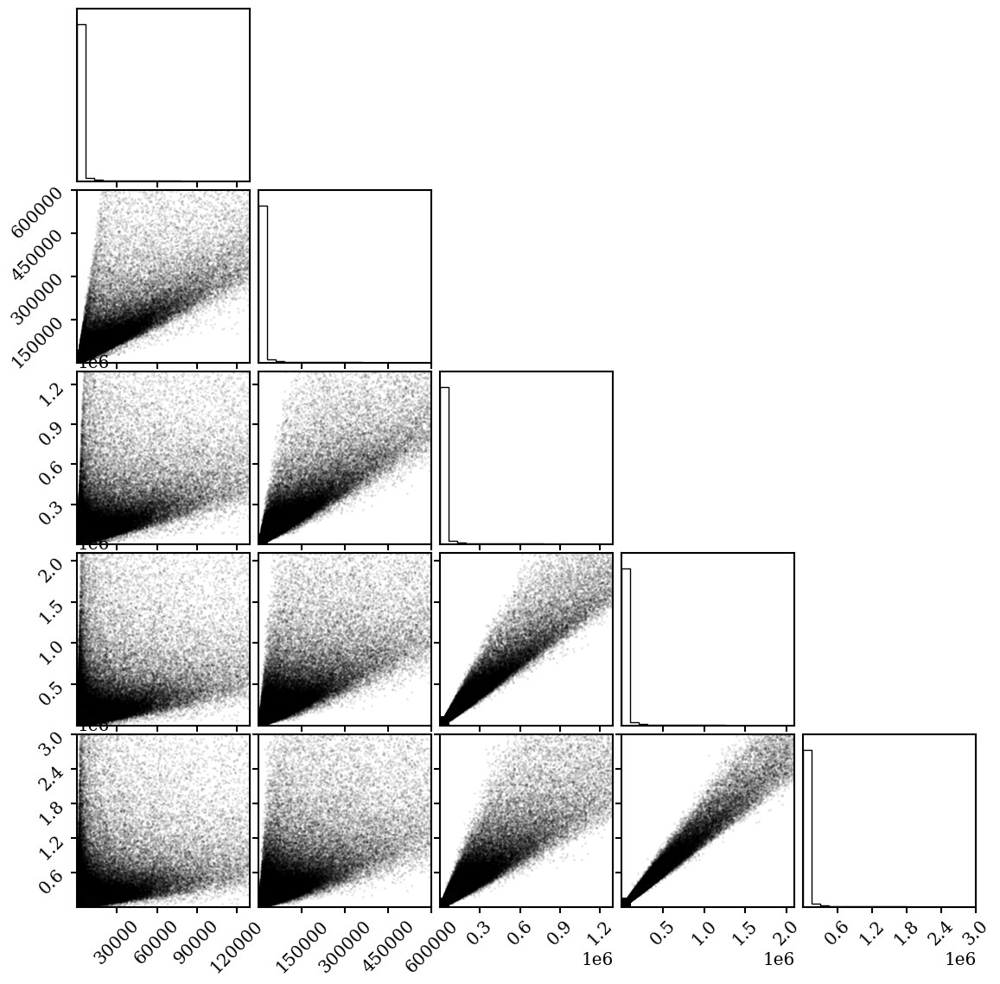

In [4]:
fig = DFM.corner(xs_flux, range=[(0., 1.3e5), (0., 6e5), (0, 1.3e6), (0., 2.1e6), (0., 3.e6)])

#### Observables in magnitude-space

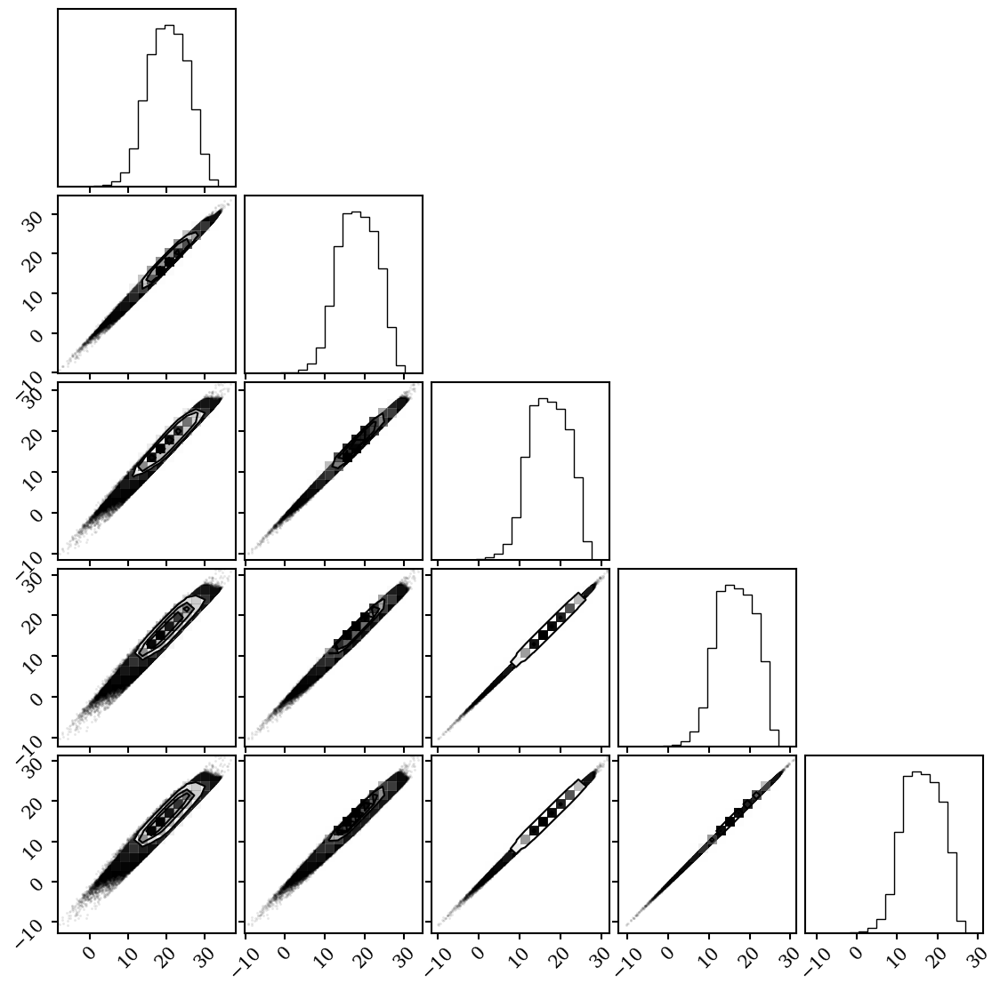

In [5]:
fig = DFM.corner(xs_mags)#, range=[(0., 1.3e5), (0., 6e5), (0, 1.3e6), (0., 2.1e6), (0., 3.e6)])

#### Galaxy properties

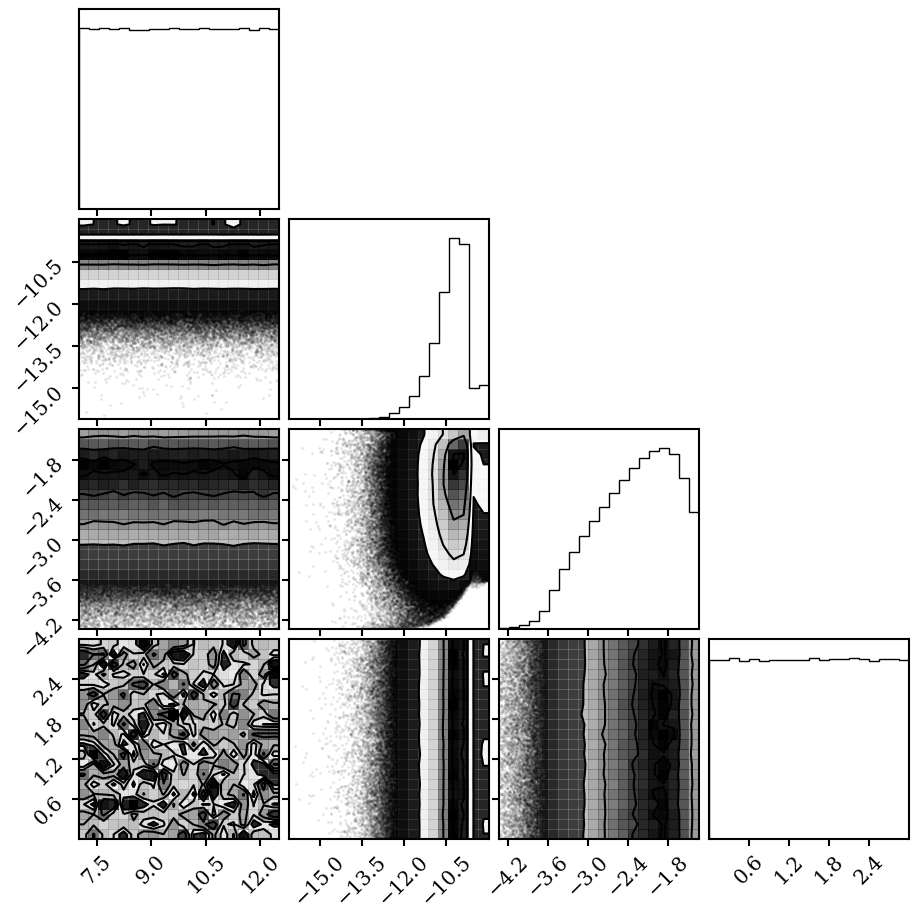

In [6]:
fig = DFM.corner(props)

#### SPS parameters

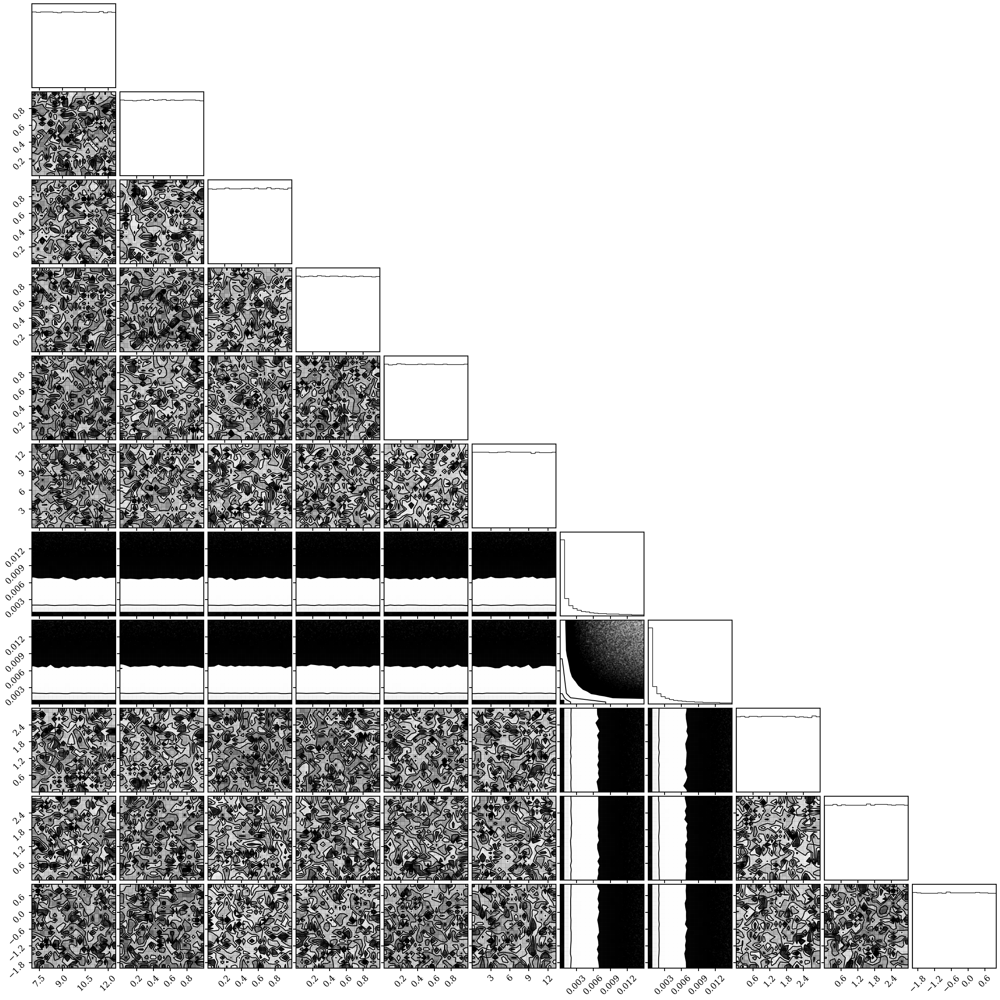

In [7]:
fig = DFM.corner(thetas_unt)

#### Saving data

#### Apply toy noise model

Toy noise model assumes that the SNRs of each photometric bands are independent with one another. According to NSA, this isn't the worst assumption...?

##### Load raw NSA data

In [9]:
import h5py
dat_dir_raw = '/media/SSD/Doktori/Csillagtomegbecsles_cikk/SED/SEDflow/data/'
# read in NSA data with clean photometry
nsa = {}
f = h5py.File(os.path.join(dat_dir_raw, 'nsa.photometry.hdf5'), 'r')
for k in f.keys(): 
    nsa[k] = f[k][...]
f.close()

##### Save magnitudes, uncertainties and redshifts to arrays

In [10]:
mags_nsa = np.array( [nsa['mag_u'], nsa['mag_g'], nsa['mag_r'], nsa['mag_i'], nsa['mag_z'] ] )
sigs_nsa = np.array( [nsa['sigma_u'], nsa['sigma_g'], nsa['sigma_r'], nsa['sigma_i'], nsa['sigma_z'] ] )
zred_nsa = nsa['redshift']

In [11]:
clean = np.all(np.isfinite(mags_nsa), axis=0) 
for i in range(5): 
    sig_cut = np.min([np.max([np.nanquantile(sigs_nsa[i,:], 0.95), 0.05]), 0.25])
    clean &= (sigs_nsa[i,:] < sig_cut)
    print('sigma_%s cut = %.3f' % (['u', 'g', 'r', 'i', 'z'][i], sig_cut))
print(np.mean(clean))

sigma_u cut = 0.111
sigma_g cut = 0.050
sigma_r cut = 0.050
sigma_i cut = 0.050
sigma_z cut = 0.059
0.895584936843348


In [12]:
mags_nsa = mags_nsa.T[clean]
sigs_nsa = sigs_nsa.T[clean]
zred_nsa = zred_nsa[clean]

We want to base the noise model on the noise distribution of NSA

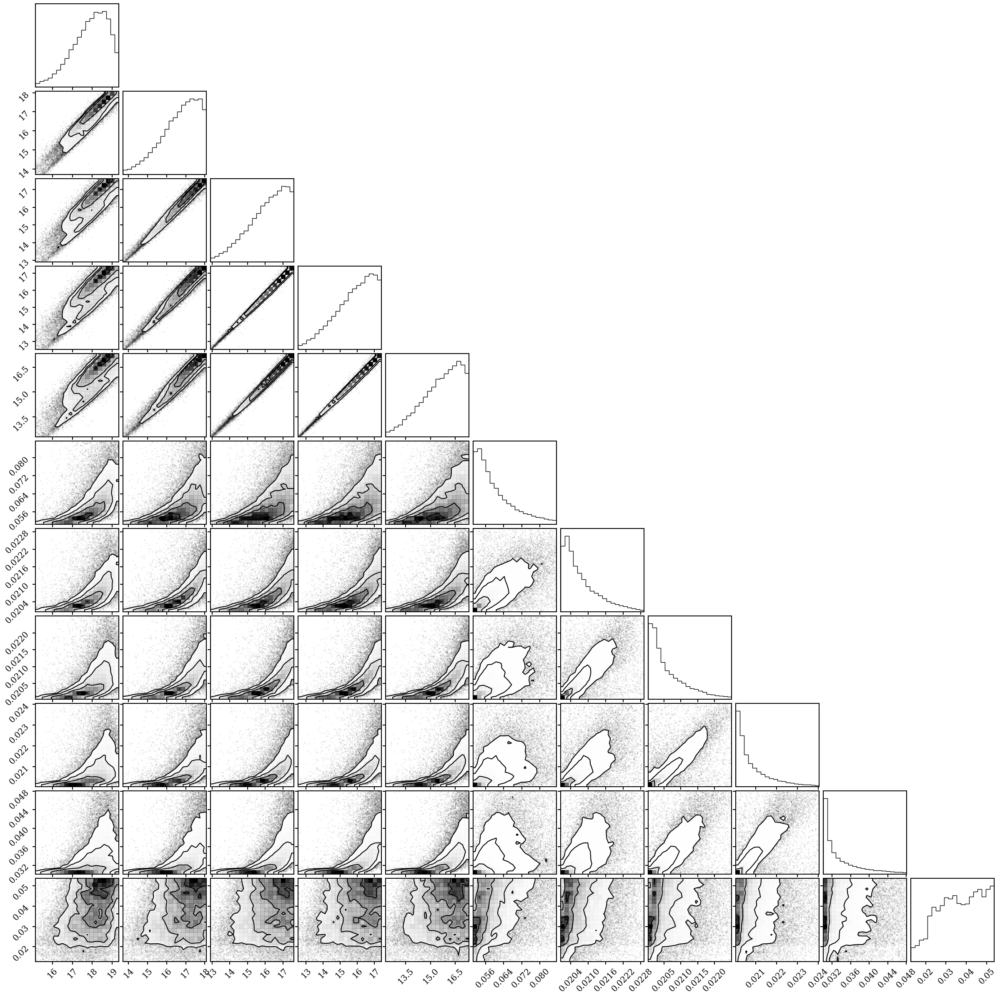

In [13]:
fig = DFM.corner(np.concatenate([mags_nsa, sigs_nsa, zred_nsa[:,None]], axis=1), 
                 range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa, zred_nsa[:,None]], axis=1), [0.01, 0.95], axis=0).T) 

In [14]:
def trimmed_median(x): 
    xlim = np.quantile(x, [0.0, 0.95])
    return np.median(x[(x > xlim[0]) & (x < xlim[1])])

def trimmed_std(x): 
    xlim = np.quantile(x, [0.0, 0.95])
    return np.std(x[(x > xlim[0]) & (x < xlim[1])])

/home/marika/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/marika/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/marika/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/marika/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/marika/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/marika/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3440: Run

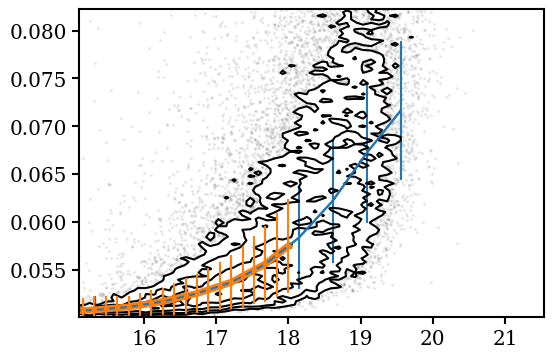

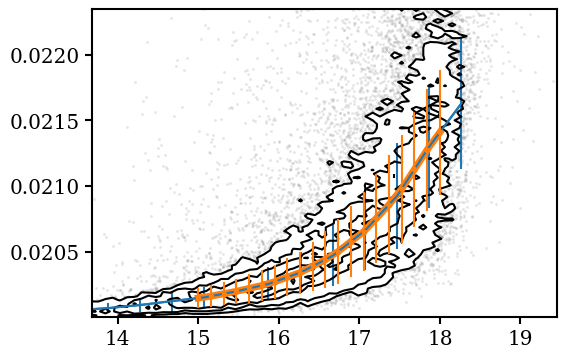

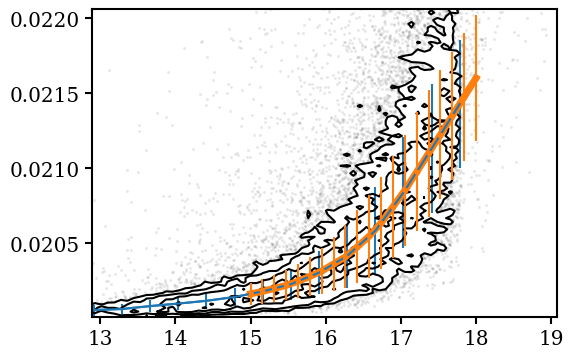

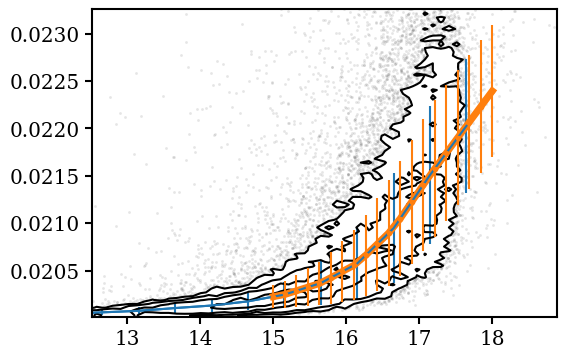

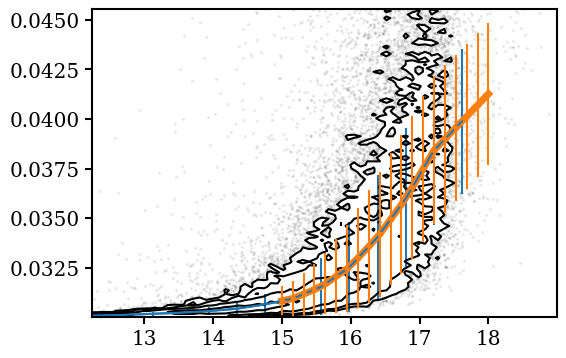

In [15]:
meds_sigs, stds_sigs = [], [] 

for i in range(5): 
    clean = (np.isfinite(mags_nsa[:,i]) & 
             (sigs_nsa[:,i] < np.quantile(sigs_nsa[:,i], 0.95)))
    
    med_sig, mags_edges, _ = binned_statistic(mags_nsa[clean,i], sigs_nsa[clean,i], statistic=trimmed_median, range=np.nanquantile(mags_nsa[clean,i], [0., 0.995]), bins=20)
    std_sig, mags_edges, _ = binned_statistic(mags_nsa[clean,i], sigs_nsa[clean,i], statistic=trimmed_std, range=np.nanquantile(mags_nsa[clean,i], [0., 0.995]), bins=20)
    
    meds_sigs.append(interp1d(0.5*(mags_edges[1:] + mags_edges[:-1]), med_sig, fill_value='extrapolate'))
    stds_sigs.append(interp1d(0.5*(mags_edges[1:] + mags_edges[:-1]), std_sig, fill_value='extrapolate'))
    
    fig = plt.figure(figsize=(6,4))
    sub = fig.add_subplot(111)
    sub.plot(0.5*(mags_edges[1:] + mags_edges[:-1]), med_sig, c='C0')
    sub.errorbar(0.5*(mags_edges[1:] + mags_edges[:-1]), med_sig,
                 yerr=std_sig, c='C0')
    DFM.hist2d(mags_nsa[clean,i], sigs_nsa[clean,i], plot_density=False, bins=100, ax=sub)
    
    sub.plot(np.linspace(15, 18, 20), meds_sigs[-1](np.linspace(15, 18, 20)), c='C1', lw=5)
    sub.errorbar(np.linspace(15, 18, 20), meds_sigs[-1](np.linspace(15, 18, 20)), 
                 yerr=stds_sigs[-1](np.linspace(15, 18, 20)), fmt='.C1')
    sub.set_xlim(np.nanquantile(mags_nsa[clean,i], [0.01, 1.]))
    sub.set_ylim(np.nanquantile(sigs_nsa[clean,i], [0.0, 0.975]))

With fainter magnitudes we see larger uncertainties.

In [16]:
def apply_toy_noise(flux, mags): 
    ''' apply toy noise model
    '''
    sigs_noisy, sigs_flux_noisy = [], [] 
    flux_noisy, mags_noisy = [], []
    for i in range(5):
        _sig_mags = meds_sigs[i](mags[:,i]) + stds_sigs[i](mags[:,i]) * np.random.normal(size=mags.shape[0])
        _sig_flux = Train.sigma_mag2flux(_sig_mags, mags[:,i])
        
        _flux_noisy = flux[:,i] + _sig_flux * np.random.normal(size=mags.shape[0])
        _mags_noisy = Train.flux2mag(_flux_noisy)
    
        sigs_noisy.append(_sig_mags)
        sigs_flux_noisy.append(_sig_flux)
        
        flux_noisy.append(_flux_noisy)
        mags_noisy.append(_mags_noisy)
    
    sigs_noisy = np.array(sigs_noisy).T
    sigs_flux_noisy = np.array(sigs_flux_noisy).T
    flux_noisy = np.array(flux_noisy).T
    mags_noisy = np.array(mags_noisy).T
    
    return mags_noisy, flux_noisy, sigs_noisy, sigs_flux_noisy

In [17]:
#xs_flux = np.load(os.path.join(dat_dir, 'data.flux_nonoise.npy'))
#xs_mags = np.load(os.path.join(dat_dir, 'data.mags_nonoise.npy'))
#zreds = np.load(os.path.join(dat_dir, 'data.zreds.npy'))

#props = np.load(os.path.join(dat_dir, 'data.props.npy'))
#thetas_unt = np.load(os.path.join(dat_dir, 'data.thetas_unt.npy'))
#thetas_sps = np.load(os.path.join(dat_dir, 'data.thetas_sps.npy'))

mags_noisy, flux_noisy, sigs_noisy, sigs_flux_noisy = apply_toy_noise(xs_flux, xs_mags)

##### Trim the training data

In [18]:
mag_cuts = np.all(np.isfinite(mags_noisy), axis=1) & np.all([(mag < cut) for mag, cut in zip(mags_noisy.T, np.nanquantile(mags_nsa, 0.99, axis=0))], axis=0)
sig_cuts = np.all(np.isfinite(sigs_noisy), axis=1) & np.all(sigs_noisy > 0., axis=1)

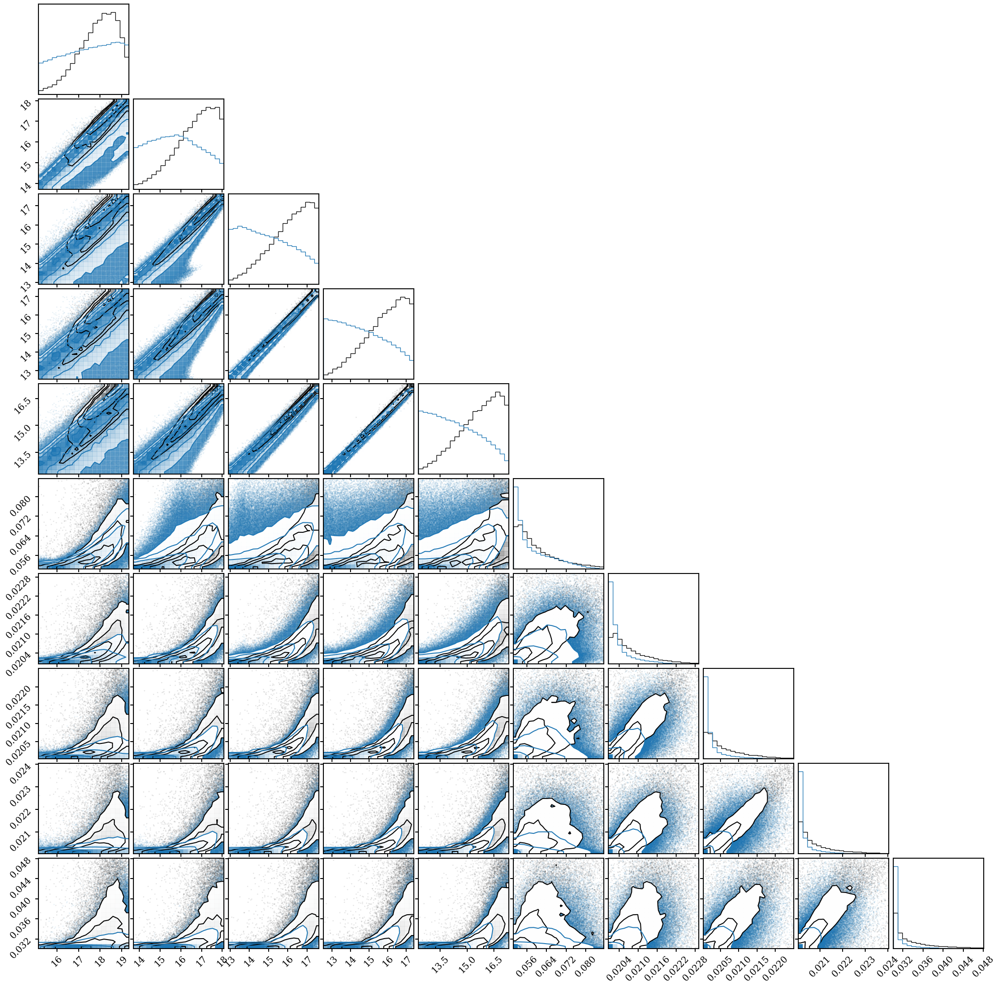

In [19]:
fig = DFM.corner(np.concatenate([mags_nsa, sigs_nsa], axis=1), 
                 range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa], axis=1), [0.01, 0.95], axis=0).T, 
                 color='k', hist_kwargs={'density': True} )
_ = DFM.corner(np.concatenate([mags_noisy, sigs_noisy], axis=1)[mag_cuts & sig_cuts],
               range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa], axis=1), [0.01, 0.95], axis=0).T, 
               color='C0', hist_kwargs={'density': True}, fig=fig)

#### Save data with toy noise

In [20]:
np.shape( flux_noisy[mag_cuts & sig_cuts] ), np.shape( mags_noisy[mag_cuts & sig_cuts] )

((363675, 5), (363675, 5))

In [21]:
dat_dir = '/media/SSD/Doktori/Csillagtomegbecsles_cikk/SED/SEDflow/my_data/'

np.save(os.path.join(dat_dir, 'data.flux.toy_noise.npy'), flux_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.mags.toy_noise.npy'), mags_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.sigs_flux.toy_noise.npy'), sigs_flux_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.sigs.toy_noise.npy'), sigs_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.zred.toy_noise.npy'), zreds[mag_cuts & sig_cuts])

np.save(os.path.join(dat_dir, 'data.prop.toy_noise.npy'), props[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.thetas_unt.toy_noise.npy'), thetas_unt[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.thetas_sps.toy_noise.npy'), thetas_sps[mag_cuts & sig_cuts])

#### Apply toy noise model to test data

Same noise model as above. Currently commented out so I don't overwrite it.

In [22]:
test_flux = np.load( os.path.join( dat_dir, 'test.v0.1.%s.npy' % ( 'flux_nonoise' ) ) )
test_mags = np.load( os.path.join( dat_dir, 'test.v0.1.%s.npy' % ( 'mags_nonoise' ) ) ) 
test_zreds = np.load( os.path.join( dat_dir, 'test.v0.1.%s.npy' % ( 'redshifts' ) ) )
test_props = np.load( os.path.join( dat_dir, 'test.v0.1.%s.npy' % ( 'props' ) ) )
test_thetas_unt = np.load( os.path.join( dat_dir, 'test.v0.1.%s.npy' % ( 'thetas_unt' ) ) )
test_thetas_sps = np.load( os.path.join( dat_dir, 'test.v0.1.%s.npy' % ( 'thetas_sps' ) ) )   

test_mags_noisy, test_flux_noisy, test_sigs_noisy, test_sigs_flux_noisy = apply_toy_noise( test_flux, test_mags )

test_mag_cuts = np.all(np.isfinite(test_mags_noisy), axis = 1) & np.all([(mag < cut) for mag, cut in zip(test_mags_noisy.T, np.nanquantile(mags_nsa, 0.99, axis=0))], axis=0)
test_sigs_cuts = np.all( np.isfinite( test_sigs_noisy ), axis = 1 ) & np.all( test_sigs_noisy > 0, axis = 1 )

np.save( os.path.join( dat_dir, 'test.flux.toy_noise.npy' ),
        test_flux_noisy[ test_mag_cuts & test_sigs_cuts ] )
np.save( os.path.join( dat_dir, 'test.mags.toy_noise.npy' ),
        test_mags_noisy[ test_mag_cuts & test_sigs_cuts ] )
np.save( os.path.join( dat_dir, 'test.sigs_flux.toy_noise.npy' ),
        test_sigs_flux_noisy[ test_mag_cuts & test_sigs_cuts ] )
np.save( os.path.join( dat_dir, 'test.sigs.toy_noise.npy' ), 
        test_sigs_noisy[ test_mag_cuts & test_sigs_cuts ] )
np.save( os.path.join( dat_dir, 'test.zred.toy_noise.npy' ),
        test_zreds[ test_mag_cuts & test_sigs_cuts ] )

np.save( os.path.join( dat_dir, 'test.prop.toy_noise.npy' ),
        test_props[ test_mag_cuts & test_sigs_cuts ] )
np.save( os.path.join( dat_dir, 'test.thetas_unt.toy_noise.npy' ),
        test_thetas_unt[ test_mag_cuts & test_sigs_cuts ] )
np.save( os.path.join( dat_dir, 'test.thetas_sps.toy_noise.npy' ),
        test_thetas_sps[ test_mag_cuts & test_sigs_cuts ] )

###### The script below is to posthoc get theta_unt and theta_sps for the noisy test data

### Construct "gold" test data

Select a subsample of 100 data points smack in the middle of the test data

In [23]:
dat_dir = '/media/SSD/Doktori/Csillagtomegbecsles_cikk/SED/SEDflow/my_data/'

mags_noisy = np.load(os.path.join(dat_dir, 'test.mags.toy_noise.npy'))
sigs_noisy = np.load(os.path.join(dat_dir, 'test.sigs.toy_noise.npy'))
flux_noisy = np.load(os.path.join(dat_dir, 'test.flux.toy_noise.npy'))
sigs_flux_noisy = np.load(os.path.join(dat_dir, 'test.sigs_flux.toy_noise.npy'))
zreds_noisy = np.load(os.path.join(dat_dir, 'test.zred.toy_noise.npy'))

props_noisy = np.load(os.path.join(dat_dir, 'test.prop.toy_noise.npy'))
thetas_unt_noisy = np.load(os.path.join(dat_dir, 'test.thetas_unt.toy_noise.npy'))
thetas_sps_noisy = np.load(os.path.join(dat_dir, 'test.thetas_sps.toy_noise.npy'))

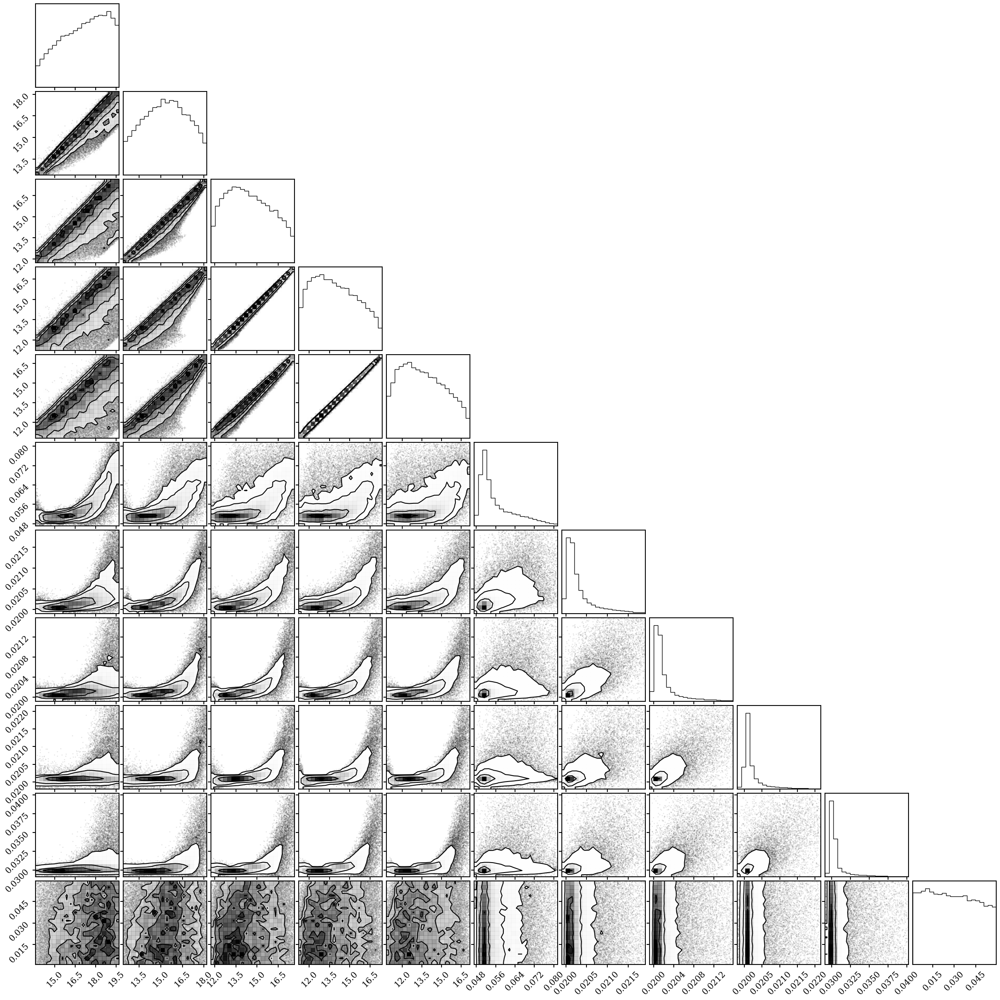

In [24]:
zreds_noisy  = zreds_noisy.reshape( np.shape(zreds_noisy)[0], 1 )
x = np.concatenate([mags_noisy, sigs_noisy, zreds_noisy], axis=1)
fig = DFM.corner(x, range=np.nanquantile(x, [0.01, 0.99], axis=0).T, color='k', hist_kwargs={'density': True})

In [26]:
gold = (
    (x[:,0] > 15.0) & (x[:,0] < 18) & 
    (x[:,1] > 14.0) & (x[:,1] < 16.5) & 
    (x[:,2] > 13.0) & (x[:,2] < 15.0) & 
    (x[:,3] > 13.0) & (x[:,3] < 15.0) & 
    (x[:,4] > 12.5) & (x[:,4] < 15) & 
    (x[:,5] > 0.05) & (x[:,5] < 0.053) & 
    (x[:,6] > 0.02) & (x[:,6] < 0.0202) &     
    (x[:,7] > 0.02) & (x[:,7] < 0.0202) & 
    (x[:,8] > 0.02) & (x[:,8] < 0.0202) &
    (x[:,9] > 0.03) & (x[:,8] < 0.0305)    
)
print(np.sum(gold))

2795


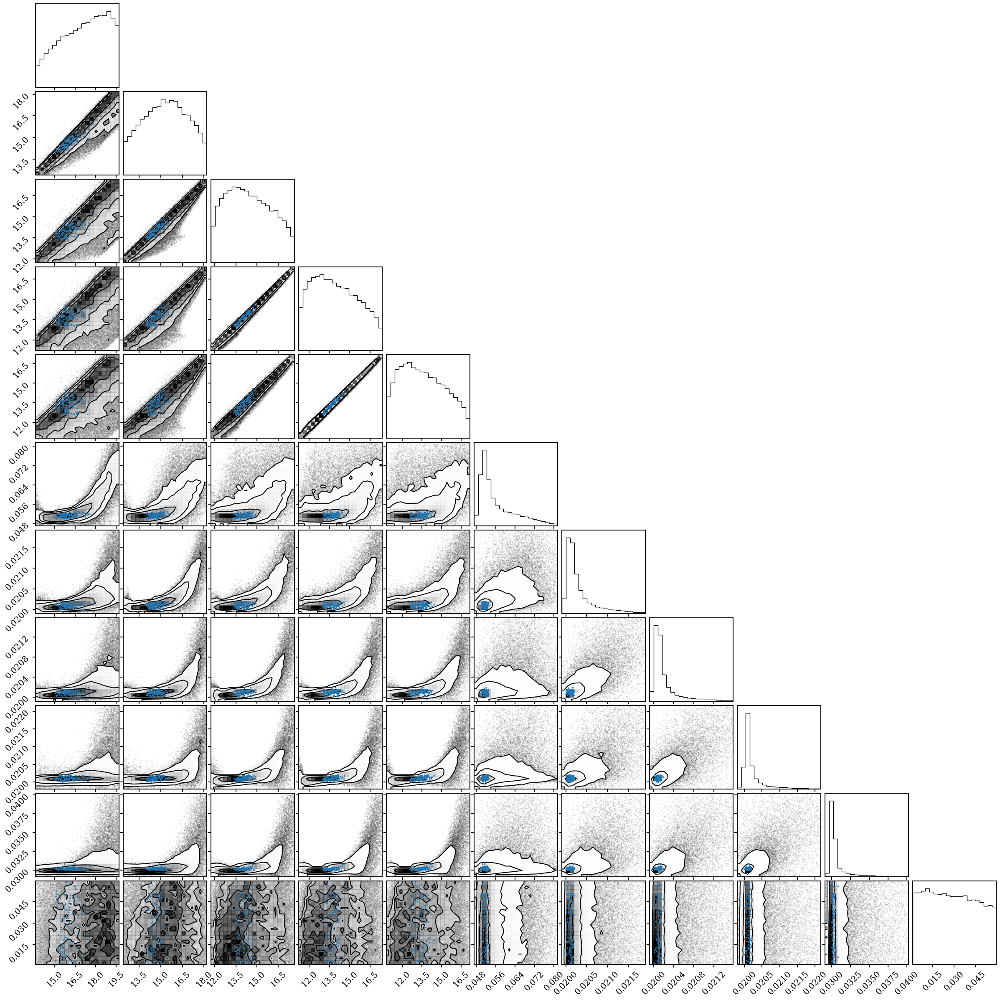

In [27]:
fig = DFM.corner(x, range=np.nanquantile(x, [0.01, 0.99], axis=0).T, color='k', hist_kwargs={'density': True})
DFM.overplot_points(fig, x[gold][:100], markersize=3)

In [28]:
np.save(os.path.join(dat_dir, 'test.gold.flux.toy_noise.npy'), flux_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.mags.toy_noise.npy'), mags_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.sigs_flux.toy_noise.npy'), sigs_flux_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.sigs.toy_noise.npy'), sigs_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.zred.toy_noise.npy'), zreds_noisy[gold][:100])

np.save(os.path.join(dat_dir, 'test.gold.prop.toy_noise.npy'), props_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.thetas_unt.toy_noise.npy'), thetas_unt_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.thetas_sps.toy_noise.npy'), thetas_sps_noisy[gold][:100])